<a href="https://colab.research.google.com/github/rinpsr/Classification-Brain-Tumor-using-CNN/blob/main/Ririn_Purnama_Sari_09011282126096_DL_Klasifikasi_Tumor_Otak.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Klasifikasi Tumor Otak dengan Metode CNN
Nama : Ririn Purnama Sari

NIM : 09011282126096

In [ ]:
import zipfile
import os
from PIL import Image
import shutil
import time
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, BatchNormalization
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("navoneel/brain-mri-images-for-brain-tumor-detection")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1


In [ ]:
path = '/root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1'

In [ ]:
print(os.listdir(path))

['yes', 'no']


In [ ]:
folder_to_delete = os.path.join(path, 'brain_tumor_dataset')
if os.path.exists(folder_to_delete):
    shutil.rmtree(folder_to_delete)
    print(f"Folder '{folder_to_delete}' berhasil dihapus.")
else:
    print(f"Folder '{folder_to_delete}' tidak ditemukan.")
print("Isi direktori setelah penghapusan:", os.listdir(path))

Folder '/root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1/brain_tumor_dataset' tidak ditemukan.
Isi direktori setelah penghapusan: ['yes', 'no']


In [ ]:
no_tumor_path = '/root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1/no'
yes_tumor_path = '/root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1/yes'

In [ ]:
def load_image(Folder):
    images=[]
    for file_name in os.listdir(Folder):
        img=cv2.imread(os.path.join(Folder,file_name))
        if img is not None:
            img=cv2.resize(img,(128,128))
            images.append(img)
    return images

In [ ]:
no_img=load_image(no_tumor_path)
yes_img=load_image(yes_tumor_path)

In [ ]:
no_labels=[0]*len(no_img)
yes_labels=[1]*len(yes_img)

In [ ]:
X=np.array(no_img + yes_img)
y=np.array(no_labels + yes_labels )

In [ ]:
print("Shape atau dimensi data ", str(X.shape))
print ("Jumlah gambar : " + str(len(X)))
print ("Jumlah label  : " + str(len(y)))
print ("Dimensi gambar:" + str(X[0].shape))

Shape atau dimensi data  (253, 128, 128, 3)
Jumlah gambar : 253
Jumlah label  : 253
Dimensi gambar:(128, 128, 3)


Dataset memiliki 253 gambar, masing-masing dengan dimensi 128x128 piksel dan 3 kanal warna (RGB).

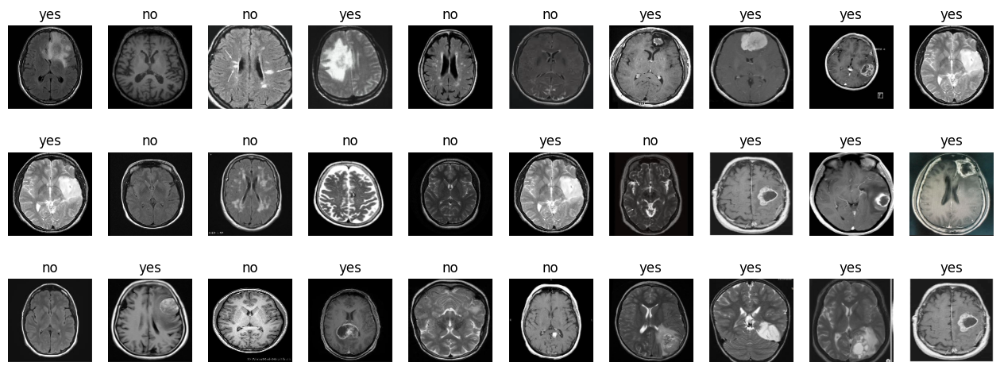

In [ ]:
#Menampilkan 30 gambar dari dataset secara random
num_of_images = 30
plt.figure(figsize=(16, 10))
for index in range(1, num_of_images + 1):
    Rand_image = random.randint(0, len(X) - 1)
    class_names = "no" if y[Rand_image] == 0 else "yes"
    plt.subplot(5, 10, index).set_title(f'{class_names}')
    plt.axis('off')
    plt.imshow(X[Rand_image], cmap='gray_r')
plt.show()

In [ ]:
class_counts = {}
for class_name in os.listdir(path):
  class_path = os. path.join(path, class_name)
  if os.path.isdir(class_path):
    num_images = len(os.listdir(class_path))
    class_counts[class_name] = num_images

for class_name, count in class_counts.items():
  print(f'Kelas: {class_name}, Jumlah gambar: {count}')

Kelas: yes, Jumlah gambar: 155
Kelas: no, Jumlah gambar: 98


In [ ]:
class_folders = [folder for folder in os.listdir(path) if os.path.isdir(os.path.join(path, folder))]

for folder in class_folders:
  print (folder)

yes
no


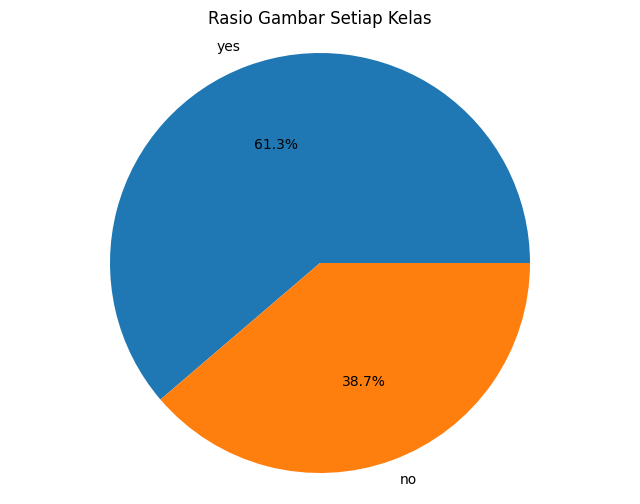

In [ ]:
plt.figure(figsize=(8,6))
plt.pie(class_counts.values(), labels=class_counts.keys(), autopct='%1.1f%%')
plt.title('Rasio Gambar Setiap Kelas')
plt.axis('equal')
plt.show()

**Data Preprocessing**

In [ ]:
X = X / 255.0

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

Saya menggunakan One-hot Encoding untuk mengubah label menjadi vektor biner, yang memungkinkan model memprediksi probabilitas untuk masing-masing kelas:
- Label 0 ("no tumor") akan menjadi [1, 0] (kelas pertama aktif).
- Label 1 ("yes tumor") akan menjadi [0, 1] (kelas kedua aktif).

**Augmentasi Data**

Merupakan teknik untuk meningkatkan jumlah data pelatihan dengan cara membuat variasi baru dari data yang sudah ada. Teknik ini sangat berguna untuk mencegah overfitting, memperbaiki performa model, dan meningkatkan generalisasi model pada data baru.

In [ ]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
datagen.fit(X_train)

- rotation_range=20 : Memutar gambar secara acak hingga maksimal 20 derajat (positif atau negatif).
- width_shift_range=0.2 : Menggeser gambar secara horizontal hingga 20% dari lebar gambar.
- height_shift_range=0.2 : Menggeser gambar secara vertikal hingga 20% dari tinggi gambar.
- shear_range=0.2 : mendistorsi gambar secara linier sehingga terlihat miring atau berubah sudut pandang. Dengan shear_range=0.2, sudut shear maksimum adalah 0.2 radian (~11.5°).
- zoom_range=0.2 : Memperbesar atau memperkecil gambar hingga 20%.
- horizontal_flip=True : Membalik gambar secara horizontal (kiri-kanan) secara acak.
- fill_mode='nearest' : Mengisi piksel kosong yang tercipta akibat transformasi menggunakan nilai piksel terdekat.

## Model CNN

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='softmax')
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,578 (28.20 MB)

 Trainable params: 7,392,578 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

- Convolutional Layer (Conv2D)
    - Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3))
    : Mengekstraksi fitur dari gambar input dengan menerapkan 32 filter (kernel) berukuran 3x3.
    - Aktivasi: ReLU untuk menghasilkan output non-linear.
Jika input x>0 outputnya adalah x,
Jika input x≤0 outputnya adalah 0.
Output : Sebuah tensor 128x128x32.

    - Conv2D(64, (3, 3), activation='relu') : Meningkatkan kedalaman fitur menggunakan 64 filter, tetap dengan ukuran kernel 3x3.

- Pooling Layer MaxPooling2D(pool_size=(2, 2)) : Mengurangi dimensi fitur dengan memilih nilai maksimum dari setiap area 2x2. Output: Ukuran data berkurang menjadi setengah, dari 128x128 menjadi 64x64.

- Flatten : Mengubah data yang berbentuk tensor (dimensi spasial) menjadi vektor 1D agar bisa diproses oleh lapisan dense (fully connected).
Contoh: Dari tensor 3D (misalnya 64x64x64) menjadi array 1D.

- Fully Connected Layer (Dense) : Menambahkan lapisan neural network dengan 128 neuron untuk melakukan kombinasi fitur yang lebih kompleks.

- Dropout(0.5) : Mengurangi kemungkinan overfitting dengan mengabaikan (drop) 50% neuron secara acak selama proses training.

- Output Layer (Dense)
Dense(2, activation='softmax') : Lapisan output dengan 2 neuron (untuk 2 kelas: yes dan no). Softmax mengubah output menjadi probabilitas untuk setiap kelas, sehingga totalnya = 1.


In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(datagen.flow(X_train, y_train, batch_size=32),
                    epochs=100,
                    validation_data=(X_test, y_test),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)])

Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 872ms/step - accuracy: 0.5038 - loss: 1.1210 - val_accuracy: 0.6078 - val_loss: 0.7823
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 806ms/step - accuracy: 0.6298 - loss: 0.6694 - val_accuracy: 0.6275 - val_loss: 0.6690
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 728ms/step - accuracy: 0.6764 - loss: 0.6826 - val_accuracy: 0.6275 - val_loss: 0.6465
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 983ms/step - accuracy: 0.6264 - loss: 0.6518 - val_accuracy: 0.6275 - val_loss: 0.6928
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 740ms/step - accuracy: 0.6192 - loss: 0.6023 - val_accuracy: 0.7255 - val_loss: 0.5703
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6920 - loss: 0.6007 - val_accuracy: 0.6275 - val_loss: 0.6547
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 745ms/step - accuracy: 0.6689 - loss: 0.6391 - val_accuracy: 0.6275 - val_loss: 0.6210
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6855 - loss: 0.5967 - val_accuracy: 0.6275 - val_

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.7702 - loss: 0.4575
Test Accuracy: 0.7647058963775635


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


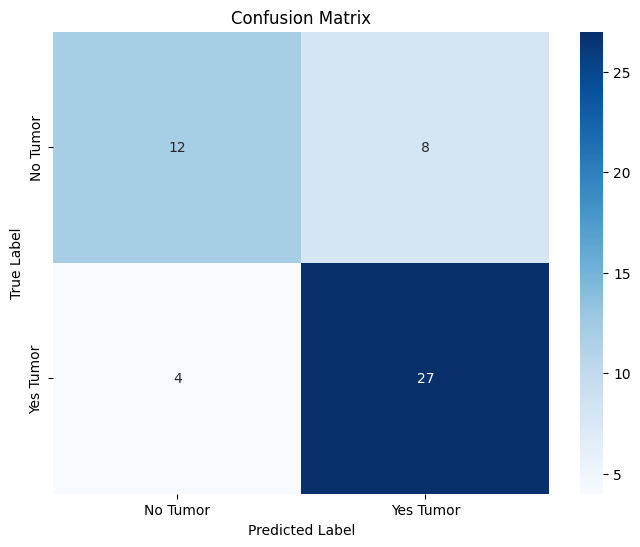


Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.60      0.67        20
           1       0.77      0.87      0.82        31

    accuracy                           0.76        51
   macro avg       0.76      0.74      0.74        51
weighted avg       0.76      0.76      0.76        51



In [ ]:
y_pred = np.argmax(model.predict(X_test), axis=-1)  # Prediksi kelas untuk X_test
y_true = np.argmax(y_test, axis=-1)  # Label yang sebenarnya
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Tumor', 'Yes Tumor'], yticklabels=['No Tumor', 'Yes Tumor'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("\nClassification Report:")
print(classification_report(y_true, y_pred))

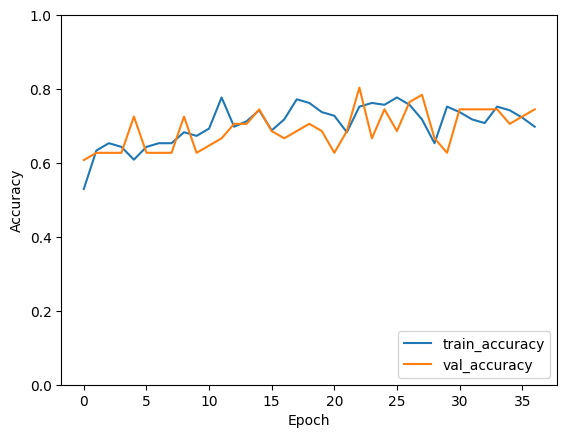

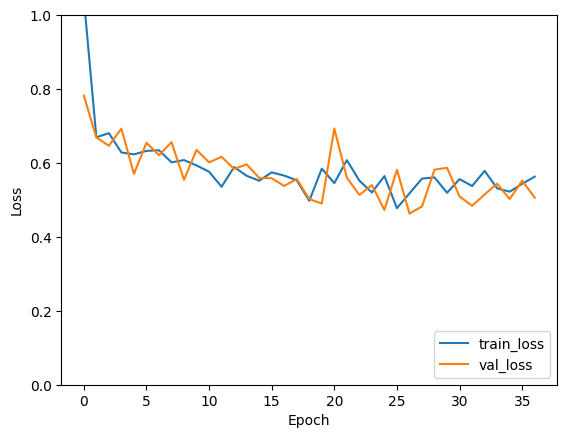

In [ ]:
plt.plot(history.history['accuracy'], label='train_accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

##**Hyperparameter Tuning**

Pertama saya menambahkan class weight karena kelas yes tumor lebih banyak daripada kelas no tumor, yaitu kelas yes 155 dan kelas no 98.

In [ ]:
from sklearn.utils import class_weight
import numpy as np

y_train_1d = np.argmax(y_train, axis=1)  # Mengubah menjadi array 1D

# Menghitung class weights berdasarkan distribusi kelas
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train_1d), y=y_train_1d)
class_weights = dict(enumerate(class_weights))

print(f"Class weights: {class_weights}")

Class weights: {0: 1.294871794871795, 1: 0.8145161290322581}


In [ ]:
history2 = model.fit(X_train, y_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(X_test, y_test),
                    class_weight=class_weights,  # Menambahkan class weights
                    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)])

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 863ms/step - accuracy: 0.7454 - loss: 0.5120 - val_accuracy: 0.8039 - val_loss: 0.4550
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 730ms/step - accuracy: 0.7425 - loss: 0.4780 - val_accuracy: 0.8039 - val_loss: 0.4067
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.8204 - loss: 0.4901 - val_accuracy: 0.8431 - val_loss: 0.4080
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 813ms/step - accuracy: 0.8552 - loss: 0.3856 - val_accuracy: 0.8431 - val_loss: 0.3279
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.8435 - loss: 0.3591 - val_accuracy: 0.8627 - val_loss: 0.3217
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 725ms/step - accuracy: 0.8943 - loss: 0.2552 - val_accuracy: 0.8627 - val_loss: 0.2874
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.9355 - loss: 0.1991 - val_accuracy: 0.9020 - val_loss: 0.2343
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 713ms/step - accuracy: 0.9293 - loss: 0.2212 - val_accuracy: 0.8627 - val_loss: 0.341

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.9400 - loss: 0.1053
Test Accuracy: 0.9411764740943909


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


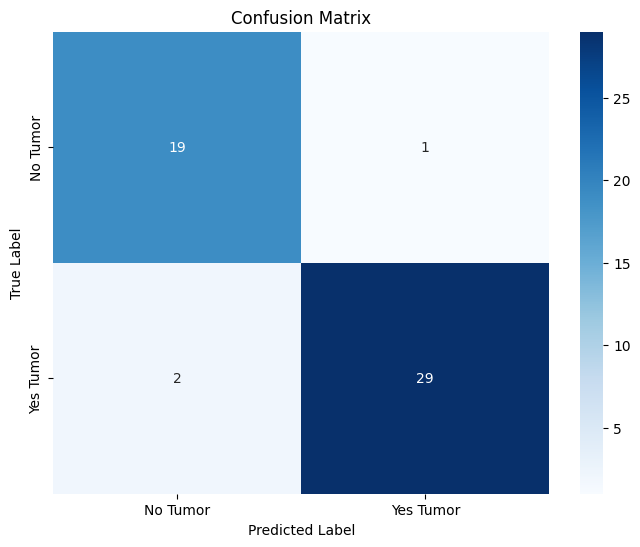


Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.95      0.93        20
           1       0.97      0.94      0.95        31

    accuracy                           0.94        51
   macro avg       0.94      0.94      0.94        51
weighted avg       0.94      0.94      0.94        51



In [ ]:
y_pred = np.argmax(model.predict(X_test), axis=-1)  # Prediksi kelas untuk X_test
y_true = np.argmax(y_test, axis=-1)  # Label yang sebenarnya
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Tumor', 'Yes Tumor'], yticklabels=['No Tumor', 'Yes Tumor'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("\nClassification Report:")
print(classification_report(y_true, y_pred))

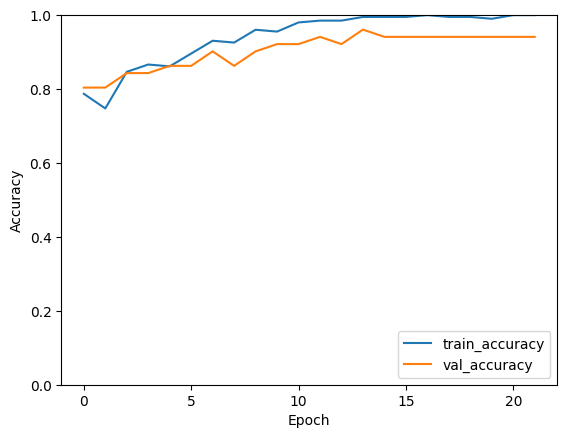

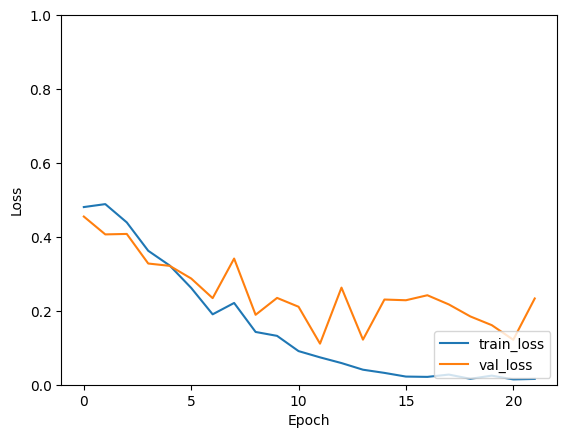

In [ ]:
plt.plot(history2.history['accuracy'], label='train_accuracy')
plt.plot(history2.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

plt.plot(history2.history['loss'], label='train_loss')
plt.plot(history2.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

99.99% Confidence This Is 'No Tumor'
Actual Label: 'No Tumor'


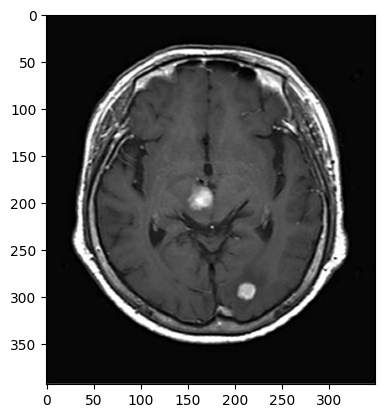

In [ ]:
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import os

# Fungsi untuk mendapatkan nama label dari indeks
names = lambda label: "Tumor" if label == 1 else "No Tumor"

# Lokasi gambar yang ingin diuji
image_path = r"/root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1/no/N17.jpg"

# Deteksi label asli dari jalur file (otomatis)
if "no" in os.path.dirname(image_path).lower():
    actual_label_index = 0
elif "yes" in os.path.dirname(image_path).lower():
    actual_label_index = 1
else:
    raise ValueError("Could not determine label from image path. Please check your folder structure.")

# Baca gambar
img = Image.open(image_path)

# Preprocessing gambar (ubah ukuran sesuai input model)
x = np.array(img.resize((128, 128)))  # Sesuaikan ukuran input model Anda
x = x.reshape(1, 128, 128, 3)        # Bentuk input (1, tinggi, lebar, channel)

# Prediksi dengan model
res = model.predict_on_batch(x)

# Ambil kelas dengan confidence tertinggi
classification = np.where(res == np.amax(res))[1][0]

# Confidence dalam persen
confidence = res[0][classification] * 100  # Ubah ke persentase

# Nama label yang diprediksi
predicted_label = names(classification)

# Nama label asli
actual_label = names(actual_label_index)

# Tampilkan gambar dan hasil prediksi
imshow(img)
print(f"{confidence:.2f}% Confidence This Is '{predicted_label}'")
print(f"Actual Label: '{actual_label}'")


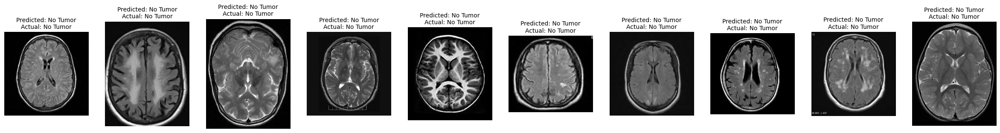

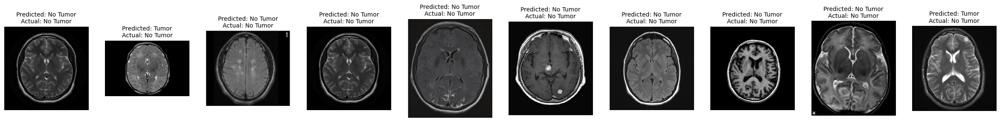

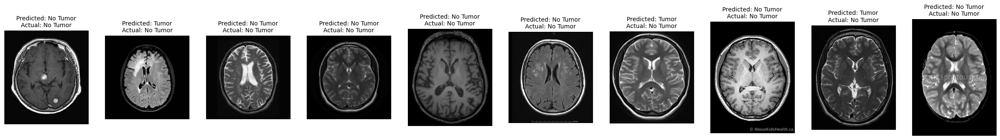

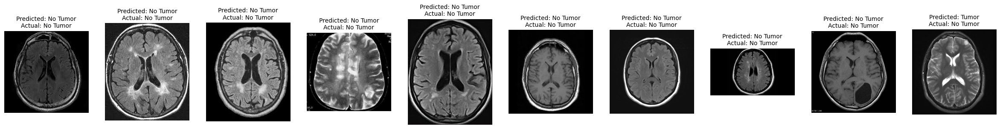

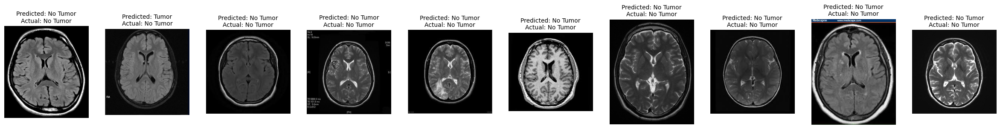

...

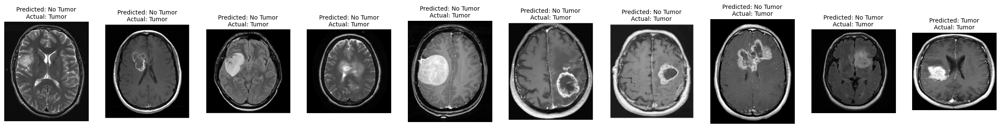

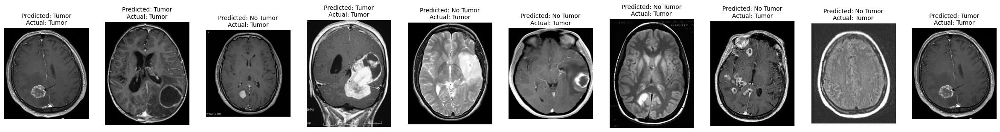

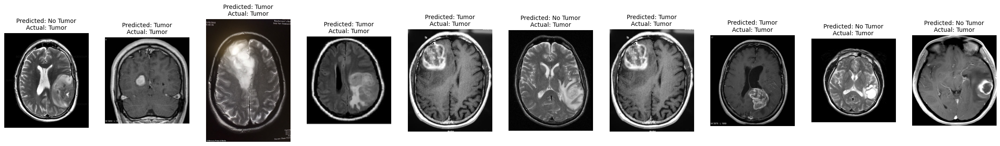

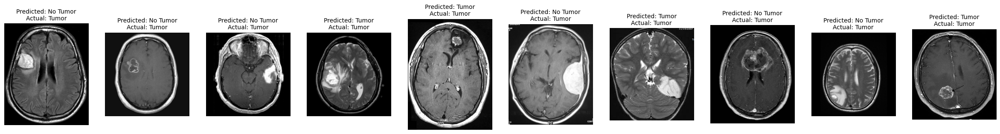

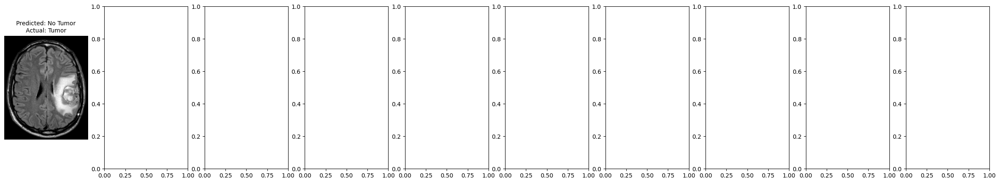

In [ ]:
from matplotlib.pyplot import imshow, show, subplots
from PIL import Image
import numpy as np
import os
from sklearn.metrics import confusion_matrix, classification_report

# Fungsi untuk mendapatkan nama label dari indeks
names = lambda label: "Tumor" if label == 1 else "No Tumor"

# Path folder dataset
paths = [
    '/root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1/no',
    '/root/.cache/kagglehub/datasets/navoneel/brain-mri-images-for-brain-tumor-detection/versions/1/yes'
]

# Variabel untuk menyimpan hasil prediksi dan label
y_true = []  # Label sebenarnya
y_pred = []  # Prediksi model

# Buat plot untuk beberapa gambar
fig, axes = subplots(1, 10, figsize=(30, 5))  # 10 gambar dalam satu baris
axes = axes.flatten()  # Ratakan agar dapat diiterasi dengan mudah
img_index = 0  # Indeks untuk subplot

# Loop melalui folder dan file di dalamnya
for folder in paths:
    for file in os.listdir(folder):
        if file.endswith('.jpg'):  # Hanya membaca file dengan ekstensi JPG
            img_path = os.path.join(folder, file)

            # Baca gambar
            img = Image.open(img_path).convert('RGB')

            # Preprocessing gambar (ubah ukuran sesuai input model)
            x = np.array(img.resize((128, 128)))  # Ukuran gambar tetap 128x128
            x = x.reshape(1, 128, 128, 3)  # Bentuk input (1, tinggi, lebar, channel)

            # Prediksi dengan model
            res = model.predict_on_batch(x)

            # Ambil kelas dengan confidence tertinggi
            classification = np.where(res == np.amax(res))[1][0]
            predicted_label = names(classification)

            # Deteksi label asli dari jalur file (otomatis)
            if "no" in folder.lower():
                actual_label_index = 0
            elif "yes" in folder.lower():
                actual_label_index = 1
            else:
                raise ValueError("Could not determine label from folder name.")
            actual_label = names(actual_label_index)

            # Simpan label untuk evaluasi
            y_true.append(actual_label_index)
            y_pred.append(classification)

            # Plot gambar dan hasil prediksi tanpa confidence
            axes[img_index].imshow(img)
            axes[img_index].axis('off')  # Hilangkan axis
            axes[img_index].set_title(
                f"Predicted: {predicted_label}\n"
                f"Actual: {actual_label}",
                fontsize=10
            )

            # Perbarui indeks gambar
            img_index += 1
            if img_index == 10:  # Jika mencapai 10 gambar, tampilkan baris
                show()
                fig, axes = subplots(1, 10, figsize=(30, 5))  # Reset subplot untuk baris baru
                axes = axes.flatten()
                img_index = 0

# Tampilkan gambar terakhir jika belum mencapai 10
if img_index != 0:
    show()